## Camera Calibration 

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

In [2]:
def calibrate_camera():
    # Arrays to store object points and image points from all the images
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane
    
    # Number of inner corners per row and column
    nx = 9
    ny = 6
    
    # Prepare object points by creating  6x8 points in an array each with 3 columns for the x,y,z coordinates of each corner
    objp = np.zeros((ny*nx, 3), np.float32)
    
    # Use numpy mgrid function to generate the coordinates that we want
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    # List of paths of camera calibration images
    image_names = glob.glob("camera_cal/*")
    
    # Loop through all the calibration images
    for name in image_names:
        # Read in the image
        img = mpimg.imread(name)

        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if(ret):
            image = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            #If corners are found, add image points and object points
            imgpoints.append(corners)
            # Object points will be the same for all of the calibration images
            # Since they represent a real chessboard
            objpoints.append(objp)
    return cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)

In [3]:
# Calibrate the camera
ret, mtx, dist, rvecs, tvecs = calibrate_camera()

## Un-Distort

In [4]:
def undistort(image):
    """
        Simple wrapper that un distorts an image
        Using previously computed camera matrix and
        distortion coefficients
    """
    return cv2.undistort(image, mtx, dist)

In [5]:
def plot_on_subplots(images, titles, cmap=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    if cmap:
        ax1.imshow(images[0], cmap=cmap)
    else:
        ax1.imshow(images[0])
    ax1.set_title(titles[0])

    if(cmap):
        ax2.imshow(images[1], cmap=cmap)
    else:
        ax2.imshow(images[1])
        
    ax2.set_title(titles[1])
    

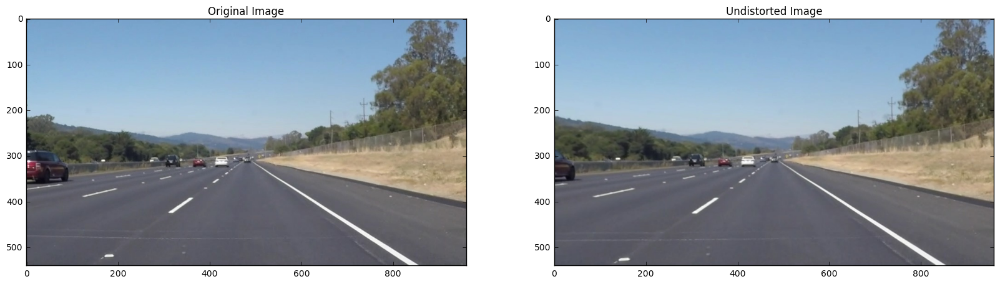

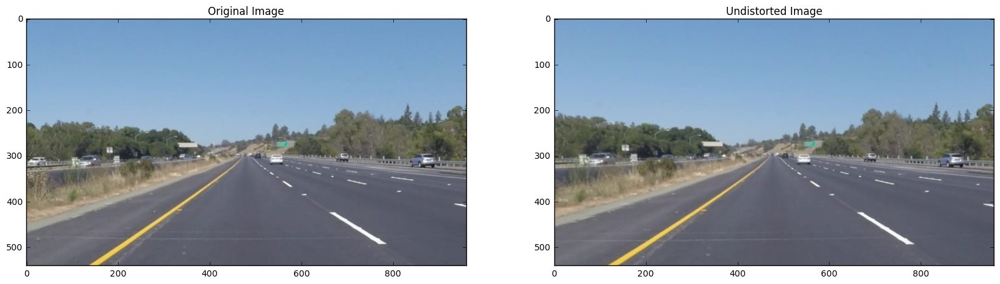

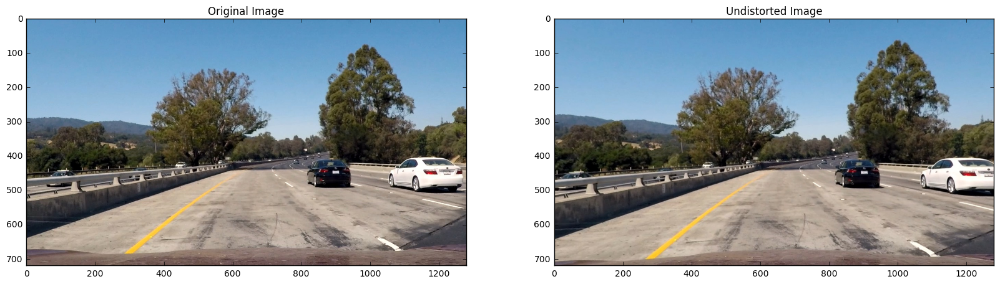

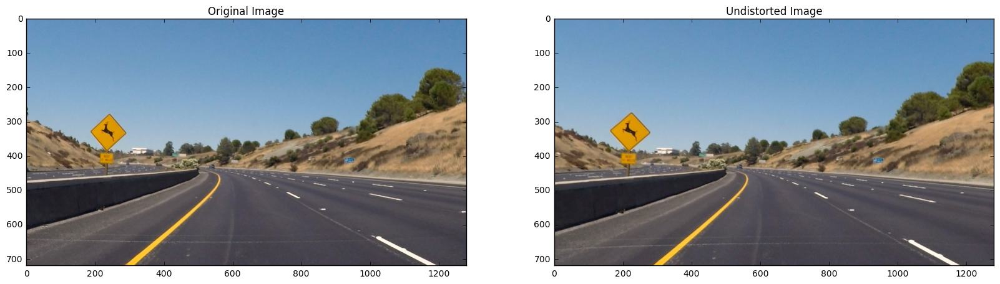

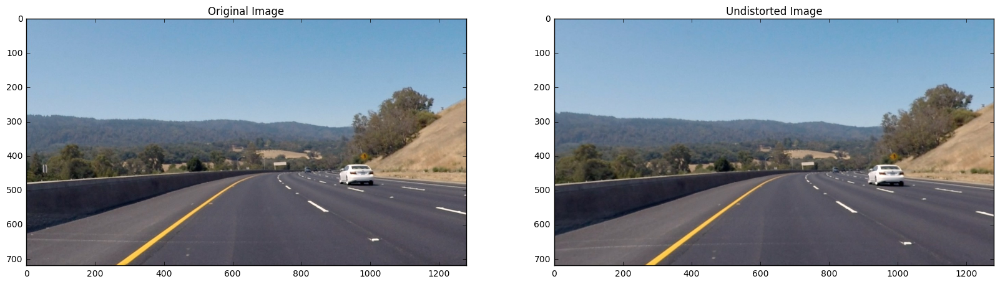

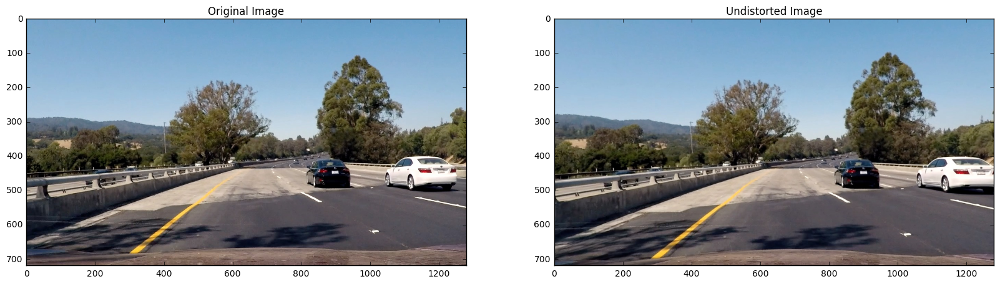

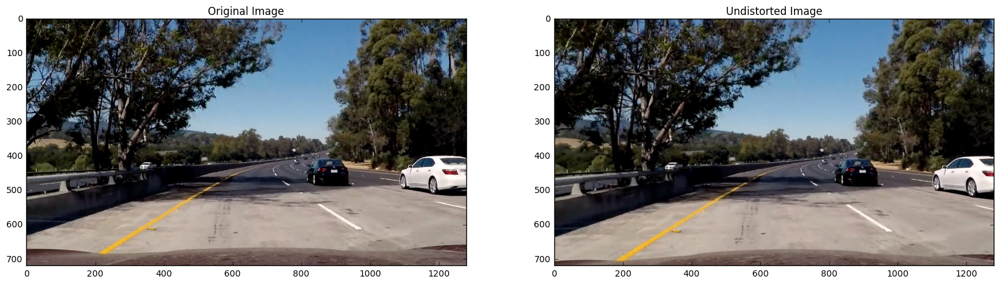

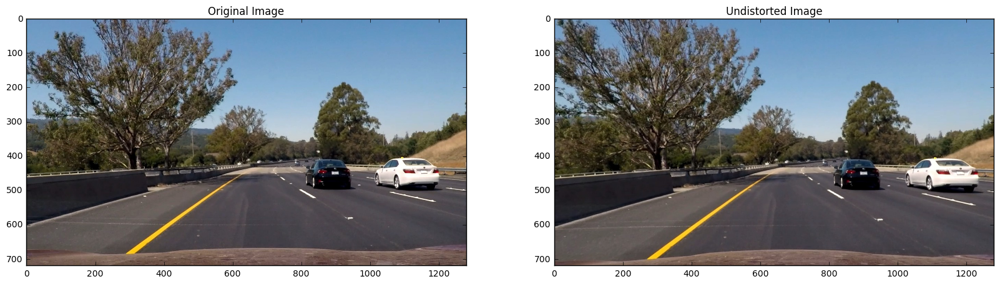

In [6]:
# Perform un-distortion on the test images
for image_name in glob.glob("test_images/*"):
    img = mpimg.imread(image_name)
    un_dist_img = undistort(img)
    
    plot_on_subplots([img, un_dist_img], ["Original Image", "Undistorted Image"])
    plt.show()

## Binary Image generator

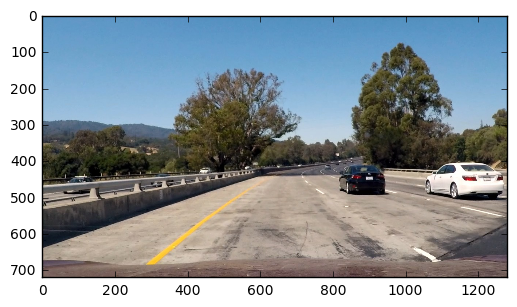

In [7]:
image = mpimg.imread(glob.glob("test_images/*")[2])
plt.imshow(image)

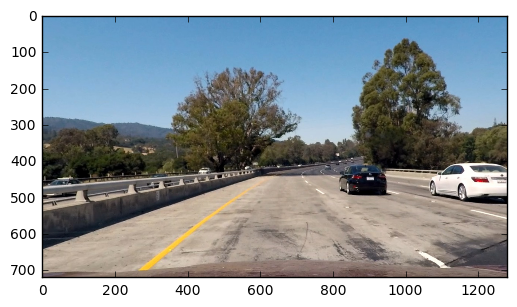

In [8]:
image = undistort(image)
plt.imshow(image)

In [9]:
def get_grayscale_thresholded_img(img, thresh=(200, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    binary = np.zeros_like(gray)
    
    binary[(gray > thresh[0]) & (gray < thresh[1])] = 1
    
    return binary

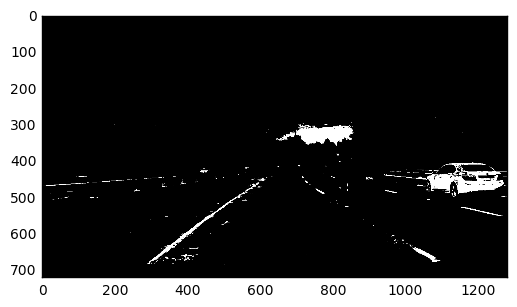

In [14]:
gti = get_grayscale_thresholded_img(image)
plt.imshow(gti, cmap="gray")

In [15]:
def get_sobel_binary(image, thresh_min=20, thresh_max=100):
    """
        Return a binary images after application
        of a sobel filter and thresholds to the result
    """
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) 
    
    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobelx = np.absolute(sobelx) 
    
    # Scale to 8 bit grayscale image
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Apply a threshold
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return sxbinary

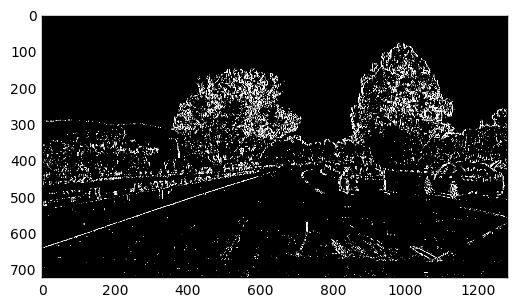

In [16]:
sobel_binary = get_sobel_binary(image)
plt.imshow(sobel_binary, cmap="gray")

In [17]:
def get_channel_index_hls(chanel_name):
    """
        Returns the index of each channel
        for an image in HLS color channel
    """
    if(chanel_name == "h"):
        return 0
    elif(chanel_name == "l"):
        return 1
    elif(chanel_name == "s"):
        return 2

In [20]:
def get_hls_channel_binary(image, channel_name='s', thresh_min=170, thresh_max=255):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Extract the desired channel
    channel_index = get_channel_index_hls(channel_name)
    channel = hls[:,:,channel_index]
    
    # Apply the threshold
    channel_binary = np.zeros_like(channel)
    channel_binary[(channel >= thresh_min) & (channel <= thresh_max)] = 1
    
    return channel_binary    

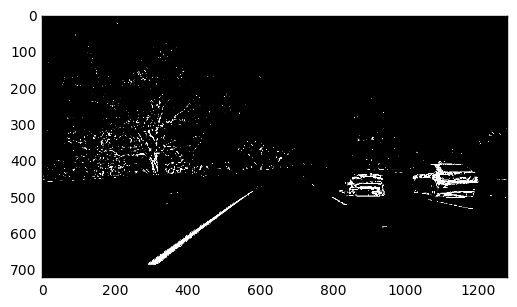

In [21]:
s_binary = get_hls_channel_binary(image)
plt.imshow(s_binary, cmap="gray")

In [22]:
def get_binary_image(image):
    """
        Combines both gradient and color channel
        thresholds to create a binary image
    """
    sobel_binary = get_sobel_binary(image)
    
    s_channel_binary = get_hls_channel_binary(image)

    gray_scale_thresholded_image = get_grayscale_thresholded_img(image)
    
    combined_binary = np.zeros_like(sobel_binary)

    combined_binary[(sobel_binary == 1) | (s_channel_binary == 1) | (gray_scale_thresholded_image == 1)] = 1
    
    return combined_binary

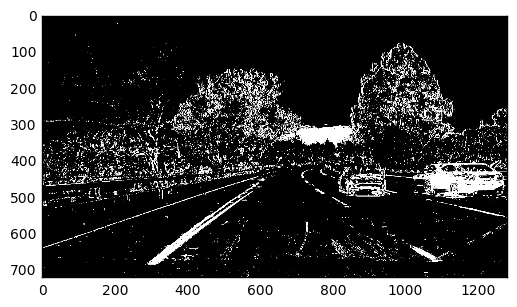

In [23]:
binary = get_binary_image(image)
plt.imshow(binary, cmap="gray")

## Perspective Transform

In [24]:
def process_image(image):
    """
        Return the result of passing the image
        through the pipeline
    """
    undistorted_image = undistort(image)
    
    binary_image = get_binary_image(undistorted_image)
    
    
    ##
    ##
    ##
    
    return binary_image

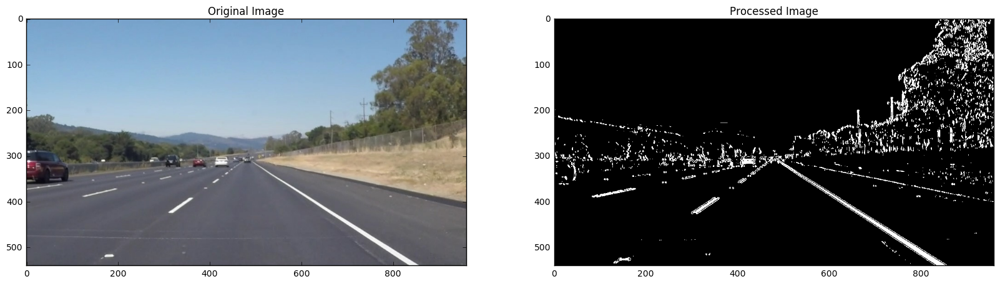

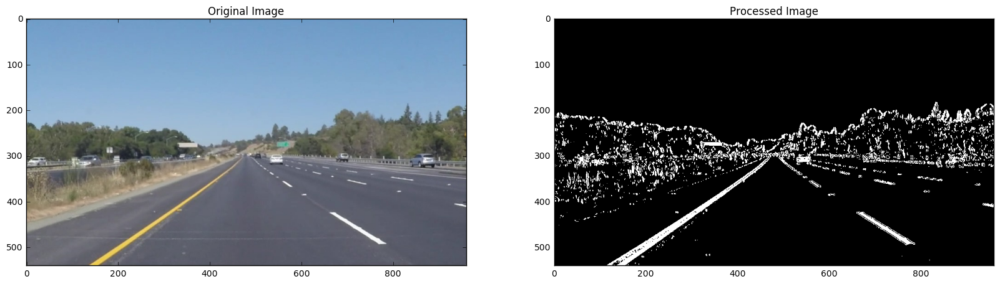

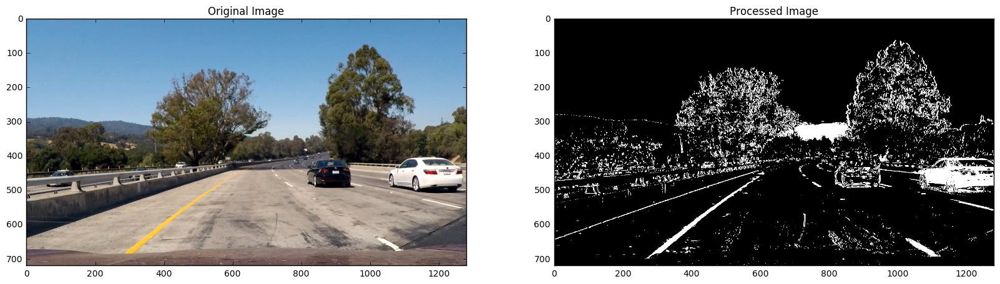

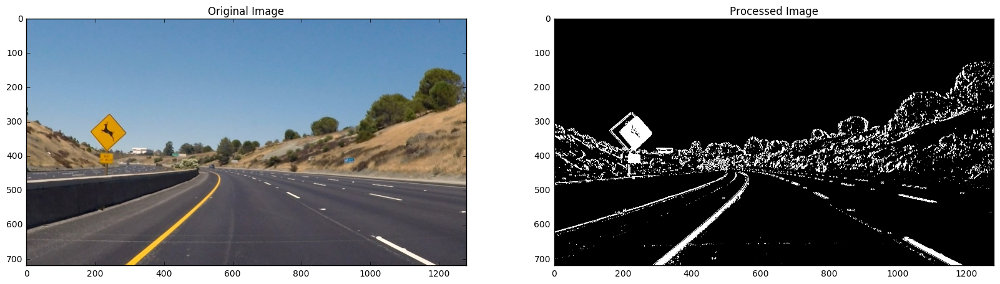

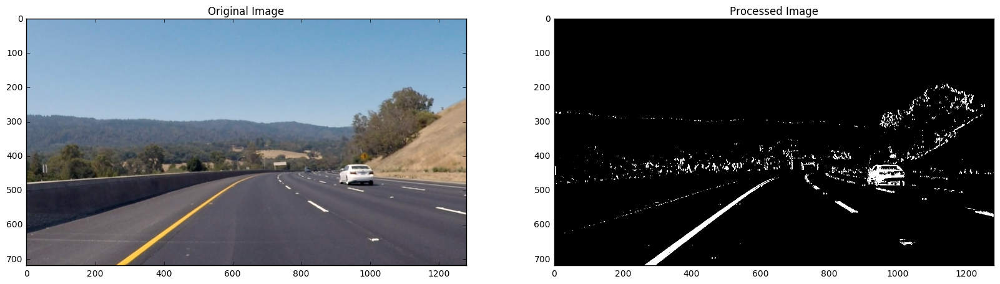

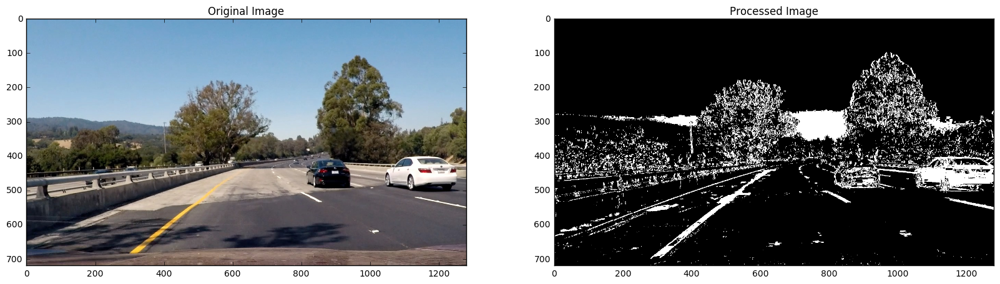

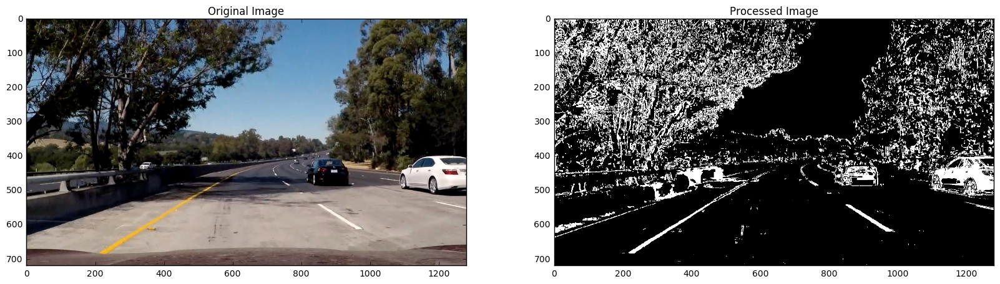

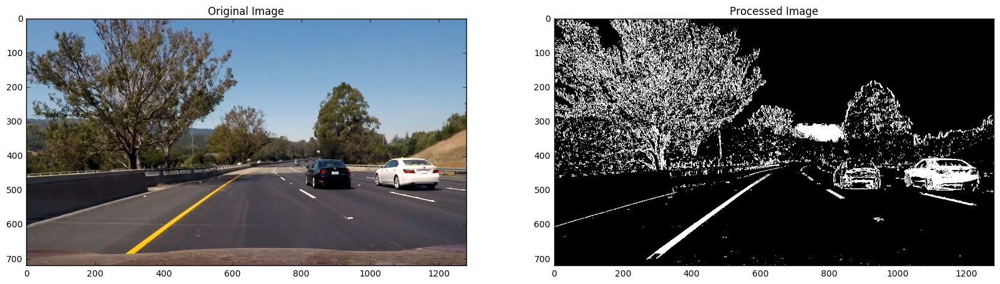

In [25]:
# Display images before and after the pipeline
for image_name in glob.glob("test_images/*"):
    img = mpimg.imread(image_name)
    result = process_image(img)
    plot_on_subplots([img, result], ["Original Image", "Processed Image"], cmap="gray")